# Preprocess the Datasets

Preprocessing Pipeline for Knee Osteoporosis Detection

We preprocess X-ray images of the knee to improve classification performance for detecting Normal, Osteopenia, and Osteoporosis conditions.

There is teo Datasets - 
1. The first without metabolic data will use us for train/validation.
2. The second dataset, with metabolic data, will use us for test.

   
The preprocessing consists of four main steps - 

1.	Removing Duplicates – Identifying and eliminating duplicate images to ensure data integrity - in both dataset. 
2.	Cropping the Knee Joint – Using a YOLO model to focus on the relevant region in the X-ray.
3.	Data Augmentation – Applying transformations to improve model generalization.
4.	X-ray Enhancement – Utilizing contrast enhancement and pseudo-coloring techniques to emphasize bone structures.

Each step produces a new dataset version, maintaining the class structure. 

### First dataset -  Train and validation Dataset Distribution Before Preprocessing


📊 **Dataset Statistics After Before Preprocessing:**
  📂 Normal: 780 images
  📂 Osteopenia: 374 images
  📂 Osteoporosis: 793 images


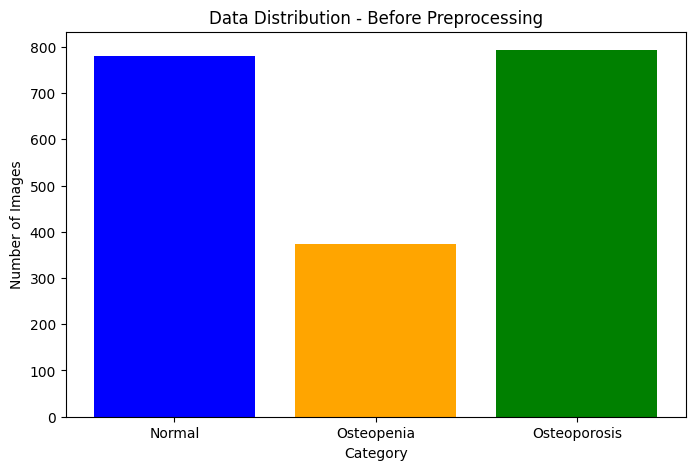

In [5]:
import os
import matplotlib.pyplot as plt

# Define dataset path
dataset_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/OS Collected Data"
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Function to print dataset statistics
def dataset_statistics(dataset_path, step_name):
    """Prints the total number of images in each category."""
    print(f"\n📊 **Dataset Statistics After {step_name}:**")
    counts = {}
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        num_images = len(os.listdir(category_path)) if os.path.exists(category_path) else 0
        counts[category] = num_images
        print(f"  📂 {category}: {num_images} images")

    # Plot bar chart
    plt.figure(figsize=(8, 5))
    plt.bar(counts.keys(), counts.values(), color=["blue", "orange", "green"])
    plt.title(f"Data Distribution - {step_name}")
    plt.ylabel("Number of Images")
    plt.xlabel("Category")
    plt.show()

# Show initial dataset distribution
dataset_statistics(dataset_path, "Before Preprocessing")

### Step 1 - Remove Duplicates

Processing Osteoporosis: 100%|██████████| 793/793 [00:04<00:00, 190.31it/s]



✅ Step 1 Complete: 1221 duplicate images removed.

📊 **Dataset Statistics After Step 1 - Duplicate Removal:**
  📂 Normal: 287 images
  📂 Osteopenia: 234 images
  📂 Osteoporosis: 205 images


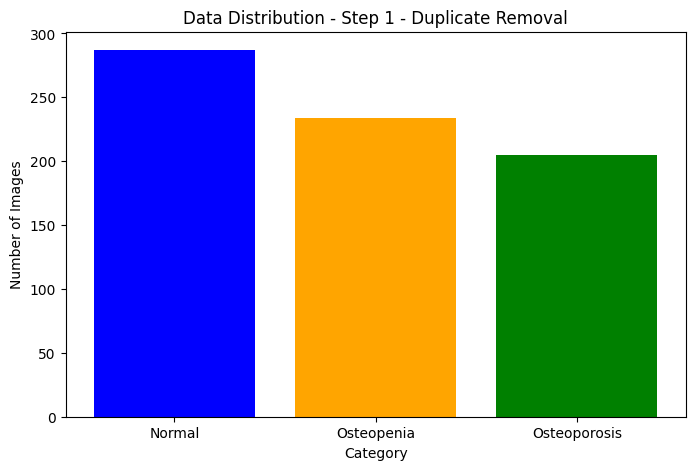

In [6]:
import imagehash
from PIL import Image
import shutil
from collections import defaultdict
from tqdm import tqdm

# Paths
output_path_step1 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates"

def analyze_and_remove_duplicates(input_path, output_path):
    """Removes duplicate images using perceptual hashing."""
    hashes = {}
    duplicates_removed = 0

    # Create output directory structure
    for category in categories:
        os.makedirs(os.path.join(output_path, category), exist_ok=True)

    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        for img_name in tqdm(os.listdir(category_path), desc=f"Processing {category}"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
                    shutil.copy(img_path, os.path.join(output_category_path, img_name))
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Step 1 Complete: {duplicates_removed} duplicate images removed.")

# Run Step 1
analyze_and_remove_duplicates(dataset_path, output_path_step1)
dataset_statistics(output_path_step1, "Step 1 - Duplicate Removal")

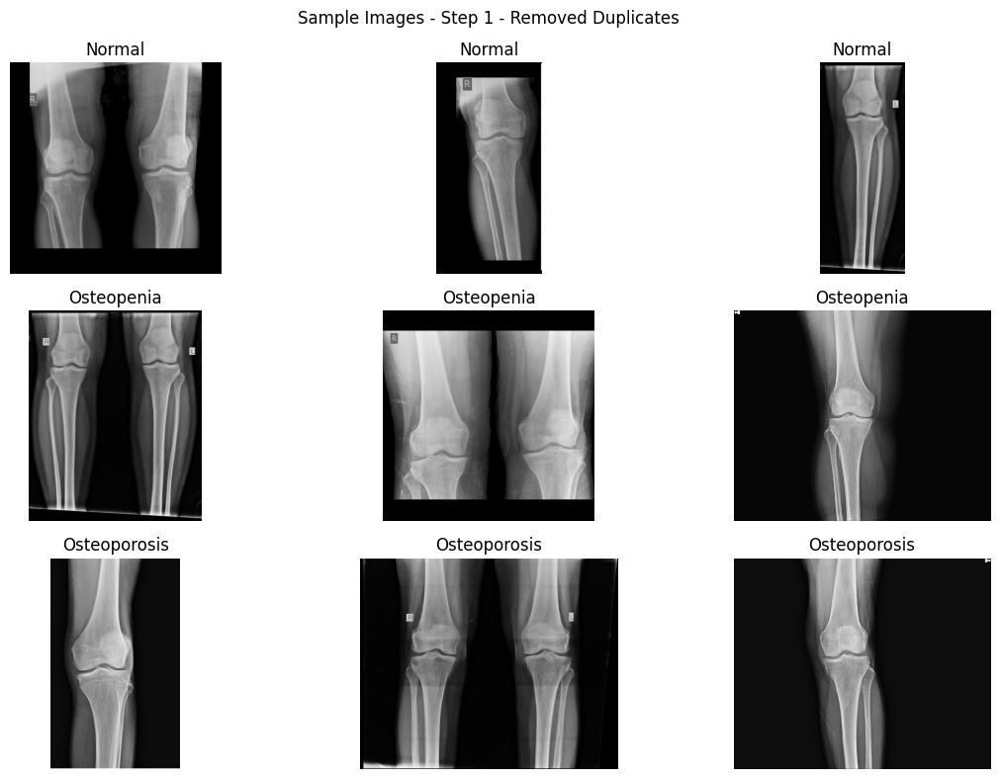

In [7]:
import random
from PIL import Image

def show_sample_images(dataset_path, step_name):
    """Displays 3 sample images from each category."""
    fig, axes = plt.subplots(len(categories), 3, figsize=(12, 8))

    for row, category in enumerate(categories):
        category_path = os.path.join(dataset_path, category)
        images = os.listdir(category_path)

        for col in range(3):
            if images:
                img_path = os.path.join(category_path, random.choice(images))
                img = Image.open(img_path)

                axes[row, col].imshow(img, cmap="gray")
                axes[row, col].axis("off")
                axes[row, col].set_title(f"{category}")

    plt.suptitle(f"Sample Images - {step_name}")
    plt.tight_layout()
    plt.show()

show_sample_images(output_path_step1, "Step 1 - Removed Duplicates")

### Step 2 - Crop Knee Joint Using YOLO

#### Knee Joint Identication

In [8]:
import random
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Get all image file paths from Step 1 (after duplicate removal)
image_paths = glob.glob(output_path_step1 + "/*/*.png")  # Adjust for multiple categories

# Ensure there are enough images in the folder
if len(image_paths) == 0:
    print("❌ No images found in the specified folder. Please check the path or file types.")
else:
    # Select 10 random images (or less if there are fewer than 10)
    random_images = random.sample(image_paths, min(10, len(image_paths)))

    # Plot YOLO Predictions
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns for 10 images

    for ax, image_path in zip(axes.flatten(), random_images):
        results = model(image_path)  # Run YOLO on the image
        result_img = results[0].plot()  # Get the annotated image

        ax.imshow(result_img)  # Display the image with bounding boxes
        ax.set_title(image_path.split("/")[-1])  # Show image filename
        ax.axis("off")  # Hide axes

    plt.tight_layout()
    plt.show()

ModuleNotFoundError: No module named 'ultralytics'

#### Identication and Display All Cropped Knees - 1, 2 knee joints per Xray

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading /Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx for ONNX Runtime inference...
Using ONNX Runtime CPUExecutionProvider

0: 640x640 2 knees, 51.1ms
Speed: 3.7ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 45.4ms
Speed: 2.3ms preprocess, 45.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.1ms
Speed: 2.7ms preprocess, 36.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.8ms
Speed: 3.8ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.6ms
Speed: 2.6ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


/var/folders/x8/3sd1f18n12b332zmvb89nvp80000gn/T/ipykernel_38718/4156058061.py:90: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


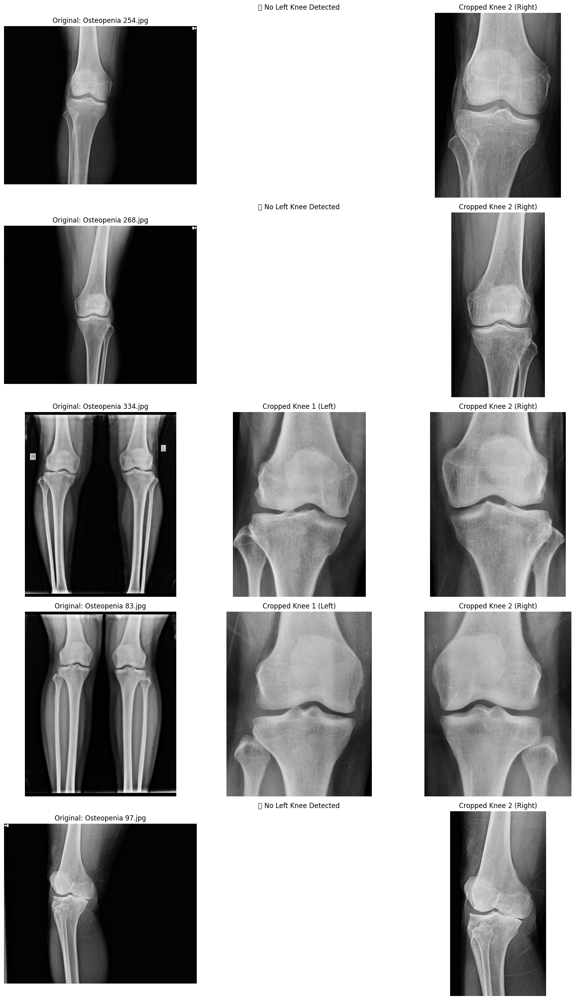

In [ ]:
import glob
import cv2
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Path to Osteopenia images from Step 1
osteopenia_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates/Osteopenia"

# Find all images, supporting multiple formats
image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(osteopenia_path, f"*.{ext}")))

# Select up to 5 images
num_images = min(5, len(image_paths))

if num_images == 0:
    print("⚠️ No images found! Check the folder path or file formats.")
else:
    selected_images = image_paths[:num_images]

    # Create figure dynamically
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))  # 3 columns: Original + 2 Crops

    for i, img_path in enumerate(selected_images):
        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Cannot read image: {img_path}")
            continue

        results = model(image)

        # Plot the original image
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {os.path.basename(img_path)}")
        axes[i, 0].axis("off")

        # Extract all detected knees
        cropped_knees = []
        confidences = []
        width_threshold = image.shape[1] // 2  # Half of image width

        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                confidence = box.conf[0].item()

                cropped_knee = image[y1:y2, x1:x2]

                # Store only if valid
                if cropped_knee.size != 0:
                    cropped_knees.append((cropped_knee, confidence, x1, x2))

        # **Filter detections**
        left_knee, right_knee = None, None
        left_conf, right_conf = 0, 0

        for knee, conf, x1, x2 in cropped_knees:
            # Classify as LEFT or RIGHT knee
            if x2 < width_threshold:  # Left side of image
                if conf > left_conf:
                    left_knee, left_conf = knee, conf
            else:  # Right side of image
                if conf > right_conf:
                    right_knee, right_conf = knee, conf

        # Show cropped knees
        if left_knee is not None:
            axes[i, 1].imshow(cv2.cvtColor(left_knee, cv2.COLOR_BGR2RGB))
            axes[i, 1].set_title(f"Cropped Knee 1 (Left)")
            axes[i, 1].axis("off")
        else:
            axes[i, 1].set_title("❌ No Left Knee Detected")
            axes[i, 1].axis("off")

        if right_knee is not None:
            axes[i, 2].imshow(cv2.cvtColor(right_knee, cv2.COLOR_BGR2RGB))
            axes[i, 2].set_title(f"Cropped Knee 2 (Right)")
            axes[i, 2].axis("off")
        else:
            axes[i, 2].set_title("❌ No Right Knee Detected")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

#### Cropping the knee joints

In [ ]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# Load YOLO model
model_path = "/Users/gideonbonwitt/Documents/Msc/osteoporosis_project/yolo_run/weights/best.onnx"
model = YOLO(model_path)

# Paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates"
output_path_step2 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure output directories exist
for category in categories:
    os.makedirs(os.path.join(output_path_step2, category), exist_ok=True)

def crop_and_save_knees(input_path, output_path):
    """Uses YOLO to detect and save cropped knee joints from X-ray images."""
    
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Get all images
        image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(category_path, f"*.{ext}")))

        print(f"📂 Processing {category} - {len(image_paths)} images")

        for img_path in tqdm(image_paths, desc=f"Cropping {category}"):
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Skipping unreadable image: {img_path}")
                continue

            results = model(image)

            # Extract detected knee joints
            cropped_knees = []
            confidences = []
            width_threshold = image.shape[1] // 2  # Half of image width

            for result in results:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()

                    cropped_knee = image[y1:y2, x1:x2]

                    if cropped_knee.size != 0:
                        cropped_knees.append((cropped_knee, confidence, x1, x2))

            # **Separate left and right knees**
            left_knee, right_knee = None, None
            left_conf, right_conf = 0, 0

            for knee, conf, x1, x2 in cropped_knees:
                if x2 < width_threshold:  # Left side
                    if conf > left_conf:
                        left_knee, left_conf = knee, conf
                else:  # Right side
                    if conf > right_conf:
                        right_knee, right_conf = knee, conf

            # Save cropped knees
            base_filename = os.path.basename(img_path)
            filename_no_ext, ext = os.path.splitext(base_filename)

            if left_knee is not None:
                left_output_path = os.path.join(output_category_path, f"{filename_no_ext}_left{ext}")
                cv2.imwrite(left_output_path, left_knee)

            if right_knee is not None:
                right_output_path = os.path.join(output_category_path, f"{filename_no_ext}_right{ext}")
                cv2.imwrite(right_output_path, right_knee)

    print("\n✅ Step 2 Complete: Cropped knee joints saved.")

# Run knee cropping
crop_and_save_knees(input_path, output_path_step2)

#### Remove duplicates

In [ ]:
import imagehash
from PIL import Image
import os
import shutil
from collections import defaultdict
from tqdm import tqdm

# Path to Step 2 dataset
step2_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

def remove_duplicates_in_place(folder_path):
    """Removes duplicate images from the same folder using perceptual hashing."""

    hashes = {}  # Stores unique image hashes
    duplicates_removed = 0

    for category in categories:
        category_path = os.path.join(folder_path, category)

        # Get all image files
        image_files = [f for f in os.listdir(category_path) if f.lower().endswith(("jpg", "jpeg", "png", "bmp", "tiff"))]

        for img_name in tqdm(image_files, desc=f"Checking {category} for duplicates"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    os.remove(img_path)  # Delete duplicate
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Removed {duplicates_removed} duplicate images from Step 2.")

# Run duplicate removal on Step 2
remove_duplicates_in_place(step2_path)

Checking Osteoporosis for duplicates: 100%|██| 172/172 [00:00<00:00, 380.46it/s]


✅ Removed 5 duplicate images from Step 2.



📊 **Dataset Statistics After Step 2 - Cropped knee joints:**
  📂 Normal: 256 images
  📂 Osteopenia: 290 images
  📂 Osteoporosis: 170 images


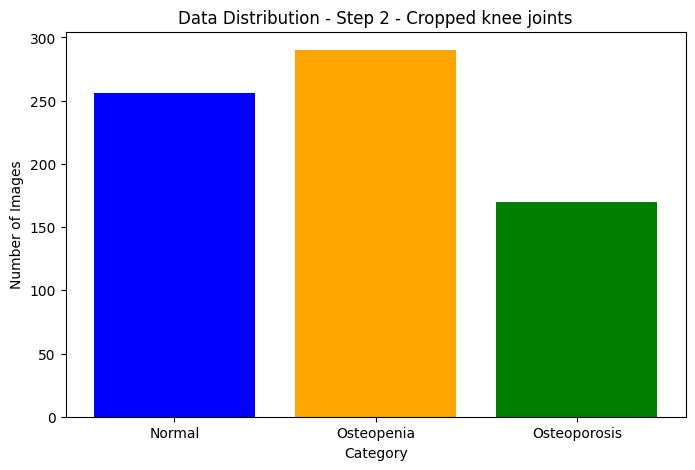

In [ ]:
dataset_statistics(output_path_step2, "Step 2 - Cropped knee joints")

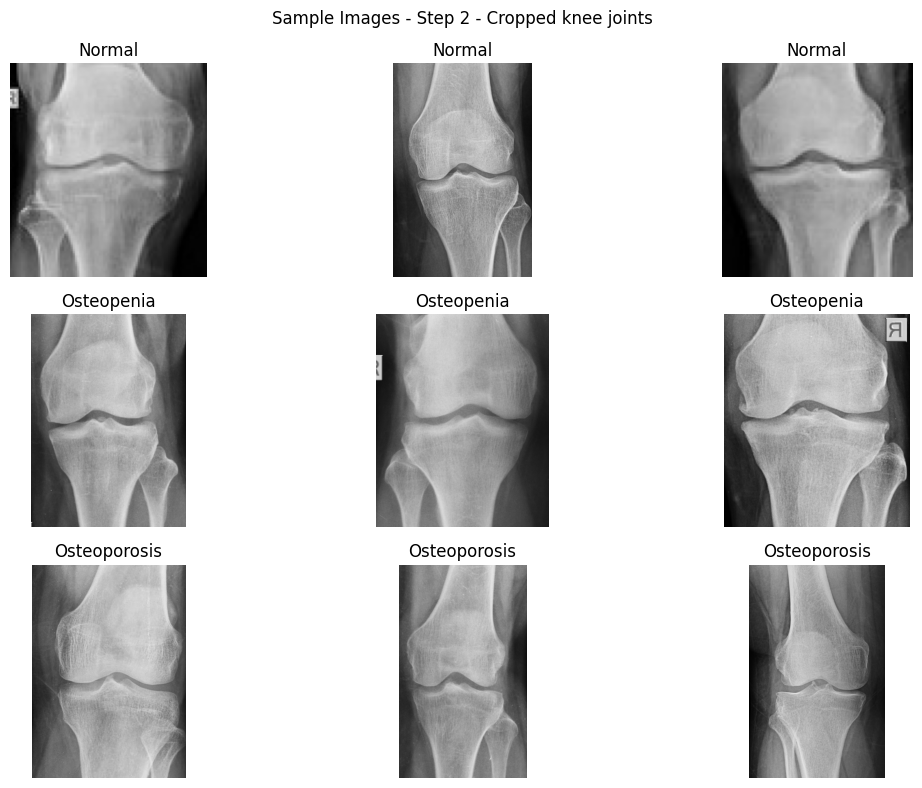

In [ ]:
show_sample_images(output_path_step2, "Step 2 - Cropped knee joints")

### Step 3 - Knee joint Augmentation

Applies 5 different augmentations, each labeled with its type:

1.	Rotation (±15°)
2.	Horizontal Flip
3.	Brightness & Contrast Adjustment
4.	Affine Transformations (Shift & Scale)
5.	Gaussian Blur

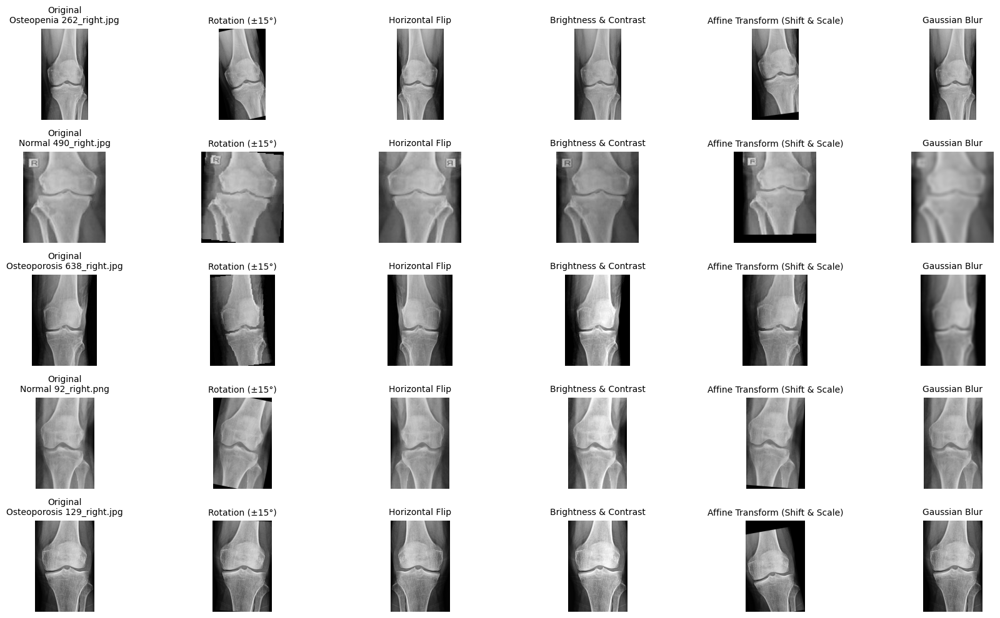

In [ ]:
import random
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image

# Path to Step 2 dataset
step2_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms with labels
augmentation_transforms = [
    ("Rotation (±15°)", transforms.RandomRotation(degrees=15)),
    ("Horizontal Flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("Brightness & Contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("Affine Transform (Shift & Scale)", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("Gaussian Blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Select 5 random images
selected_images = []
for category in categories:
    category_path = os.path.join(step2_path, category)
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    selected_images.extend(random.sample(image_paths, min(2, len(image_paths))))  # Select up to 2 per category

selected_images = random.sample(selected_images, min(5, len(selected_images)))  # Take only 5 total

# Apply augmentations and display
fig, axes = plt.subplots(len(selected_images), 6, figsize=(18, 10))

for i, img_path in enumerate(selected_images):
    img = Image.open(img_path).convert("RGB")
    
    # Show original image
    axes[i, 0].imshow(img, cmap="gray")
    axes[i, 0].set_title(f"Original\n{os.path.basename(img_path)}", fontsize=10)
    axes[i, 0].axis("off")

    # Apply augmentations
    for j, (aug_name, transform) in enumerate(augmentation_transforms):
        augmented_img = transform(img)
        axes[i, j + 1].imshow(augmented_img, cmap="gray")
        axes[i, j + 1].set_title(f"{aug_name}", fontsize=10)  # Show augmentation type
        axes[i, j + 1].axis("off")

plt.tight_layout()
plt.show()

#### Data Augmentation

In [ ]:
import os
import random
import glob
from PIL import Image
import torchvision.transforms as transforms
from tqdm import tqdm

# Paths
input_path_step2 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"
output_path_step3 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_augmented"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms
augmentation_transforms = [
    ("rotation", transforms.RandomRotation(degrees=15)),
    ("flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("brightness_contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("affine", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("gaussian_blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Create output directory structure
for category in categories:
    os.makedirs(os.path.join(output_path_step3, category), exist_ok=True)

# Process images
for category in categories:
    category_path = os.path.join(input_path_step2, category)
    output_category_path = os.path.join(output_path_step3, category)
    
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    
    for img_path in tqdm(image_paths, desc=f"Augmenting {category}"):
        img = Image.open(img_path).convert("RGB")  # Ensure RGB mode
        
        # Save the original image as well
        img.save(os.path.join(output_category_path, os.path.basename(img_path)))
        
        # Apply each augmentation
        for aug_name, transform in augmentation_transforms:
            augmented_img = transform(img)
            new_filename = f"{os.path.splitext(os.path.basename(img_path))[0]}_{aug_name}.jpg"
            augmented_img.save(os.path.join(output_category_path, new_filename))

print("\n✅ Step 3 Complete: Augmented images saved.")

Augmenting Osteoporosis: 100%|████████████████| 170/170 [00:04<00:00, 34.04it/s]


✅ Step 3 Complete: Augmented images saved.



📊 **Dataset Statistics After Step 3 - Augmented knee joints:**
  📂 Normal: 1536 images
  📂 Osteopenia: 1740 images
  📂 Osteoporosis: 1020 images


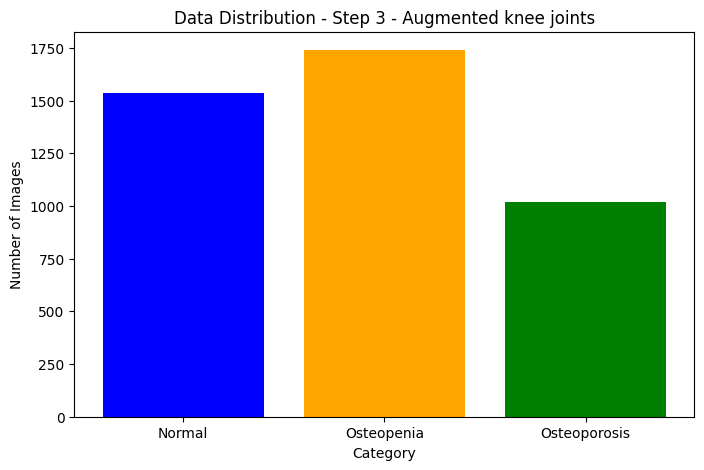

In [ ]:
dataset_statistics(output_path_step3, "Step 3 - Augmented knee joints")

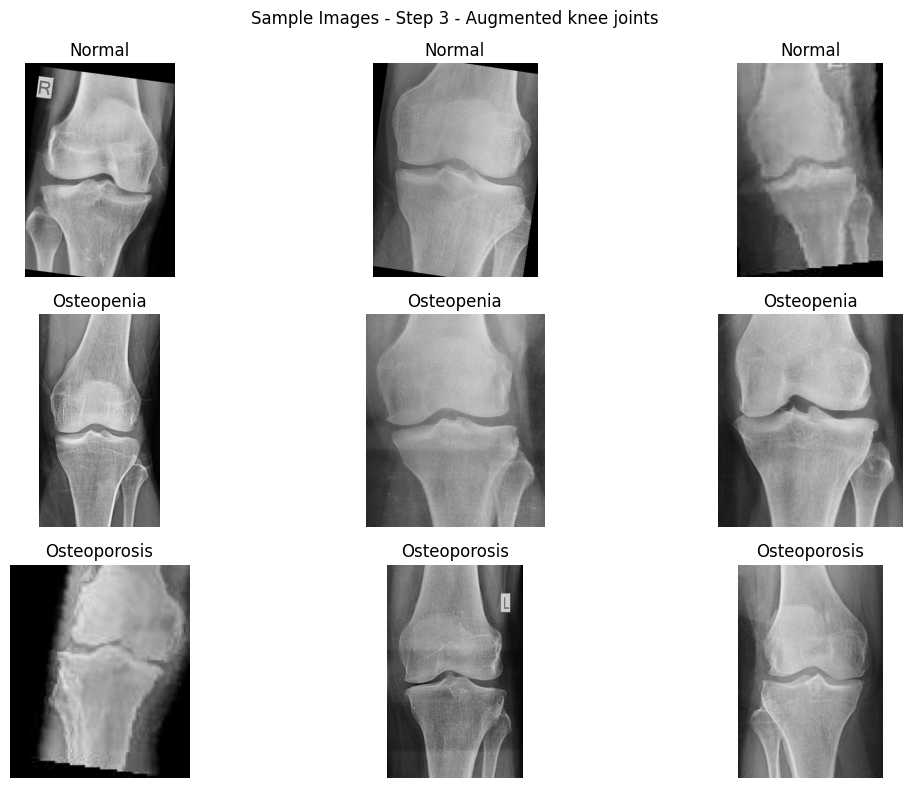

In [ ]:
show_sample_images(output_path_step3, "Step 3 - Augmented knee joints")

### Step 4 - Enhence Xray images

#### Applies four enhancement techniques:

1. CLAHE (Contrast Enhancement): Enhances bone visibility in low-contrast X-rays.
2. Unsharp Masking (Sharpening): Enhances edges and details in the X-ray.
3. Edge Detection (Canny): Highlights bone structures.
4. Pseudo-Color Mapping: Uses a color map to highlight different intensity areas.


Processing 2 images from category: Normal


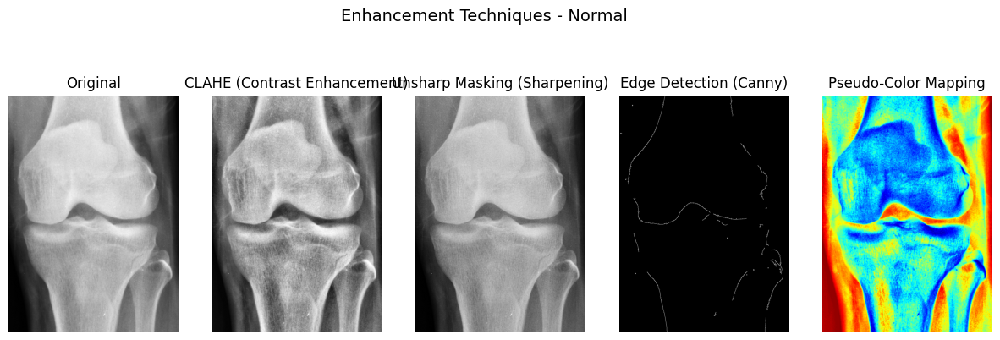

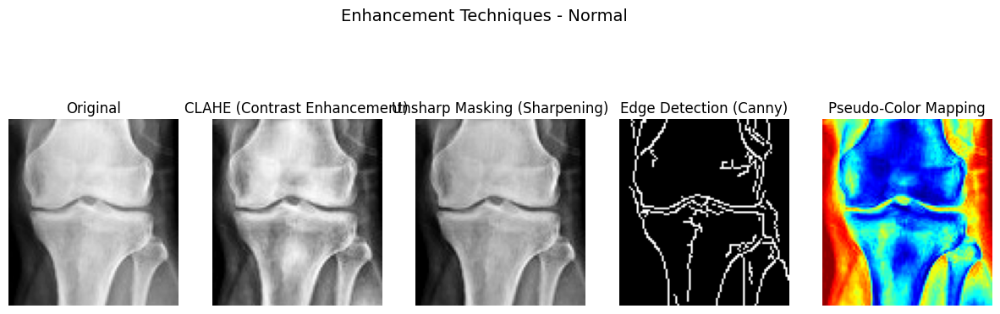


Processing 2 images from category: Osteopenia


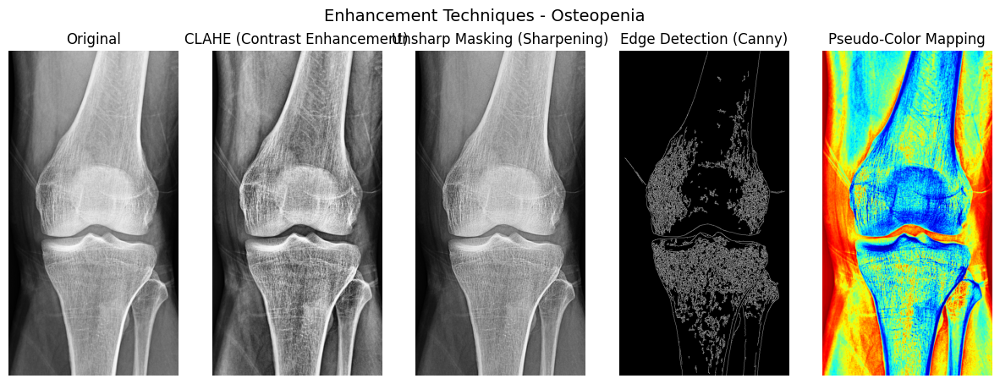

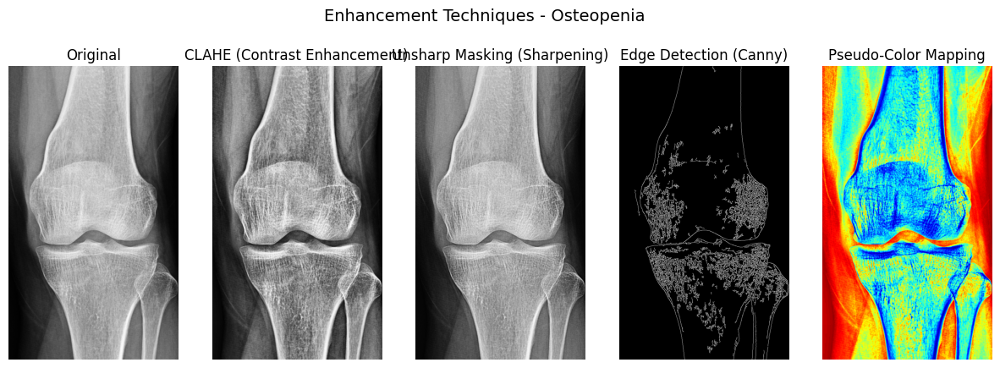


Processing 2 images from category: Osteoporosis


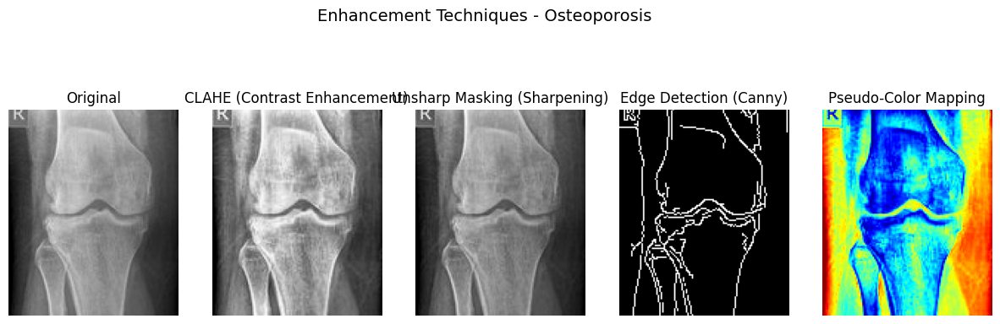

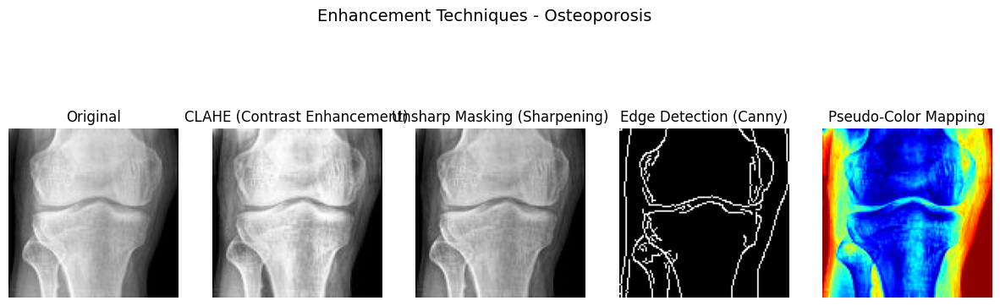

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques ###
def process_multiple_images(base_path, categories, num_images=1):
    for category in categories:
        category_path = os.path.join(base_path, category)

        # Ensure the folder exists and contains images
        if not os.path.exists(category_path) or not os.listdir(category_path):
            print(f"No images found in {category_path}. Skipping...")
            continue

        # Get all image files in the category
        image_files = [
            os.path.join(category_path, f)
            for f in os.listdir(category_path)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        # Randomly select images to process
        selected_images = random.sample(image_files, min(num_images, len(image_files)))

        print(f"\nProcessing {len(selected_images)} images from category: {category}")

        # Process each selected image
        for image_path in selected_images:
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Error loading image: {image_path}")
                continue
            
            # Apply transformations
            clahe_img = apply_clahe(img)
            sharpened_img = apply_unsharp_mask(img)
            edges_img = apply_edge_detection(img)
            pseudo_color_img = apply_pseudo_color(clahe_img)

            # Plot results
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            fig.suptitle(f"Enhancement Techniques - {category}", fontsize=14)

            axes[0].imshow(img, cmap="gray")
            axes[0].set_title("Original")
            axes[0].axis("off")

            axes[1].imshow(clahe_img, cmap="gray")
            axes[1].set_title("CLAHE (Contrast Enhancement)")
            axes[1].axis("off")

            axes[2].imshow(sharpened_img, cmap="gray")
            axes[2].set_title("Unsharp Masking (Sharpening)")
            axes[2].axis("off")

            axes[3].imshow(edges_img, cmap="gray")
            axes[3].set_title("Edge Detection (Canny)")
            axes[3].axis("off")

            axes[4].imshow(pseudo_color_img)
            axes[4].set_title("Pseudo-Color Mapping")
            axes[4].axis("off")

            plt.show()

# Run the function
process_multiple_images(base_path, categories, num_images=2)

#### Introducing a problem

variation in image quality (resolution, sharpness, contrast, and noise levels) can lead to misleading classification results. If normal X-rays are of high quality and osteoporosis X-rays are blurry or low-resolution, the model might misinterpret sharp details in normal images as abnormalities, and miss osteoporosis signs in poor-quality images.

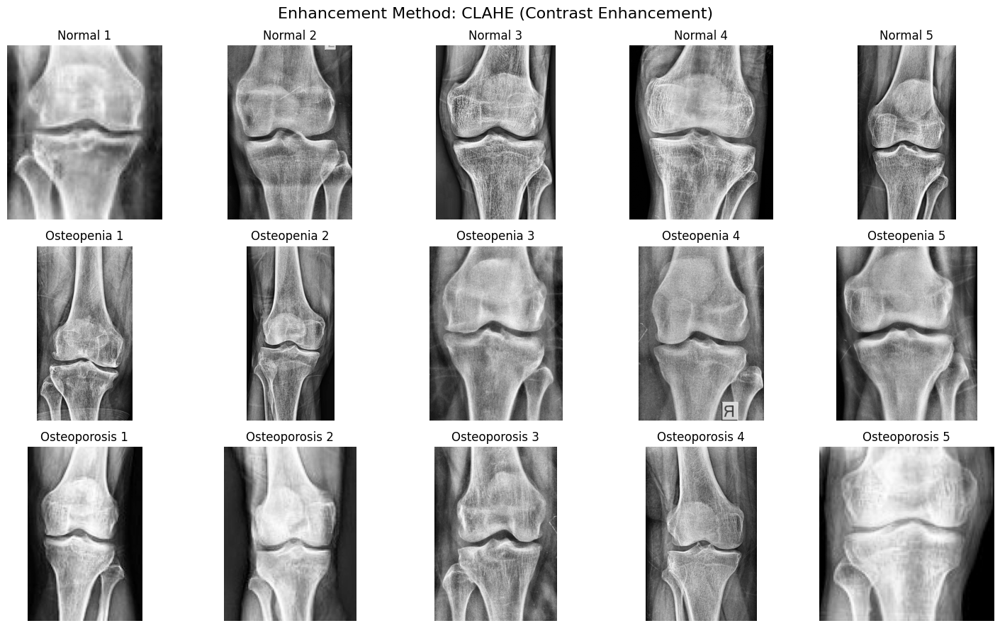

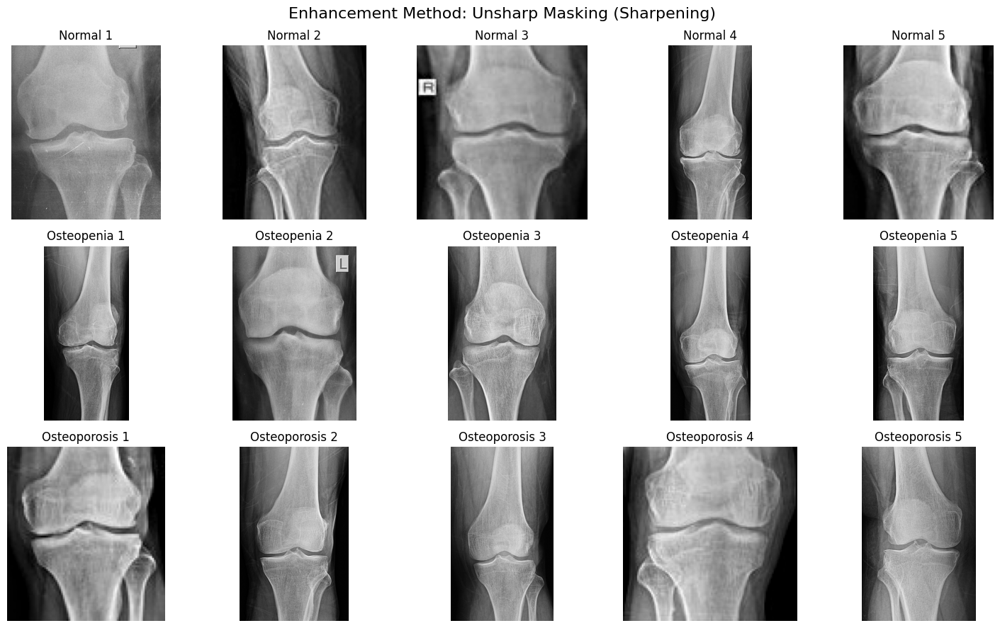

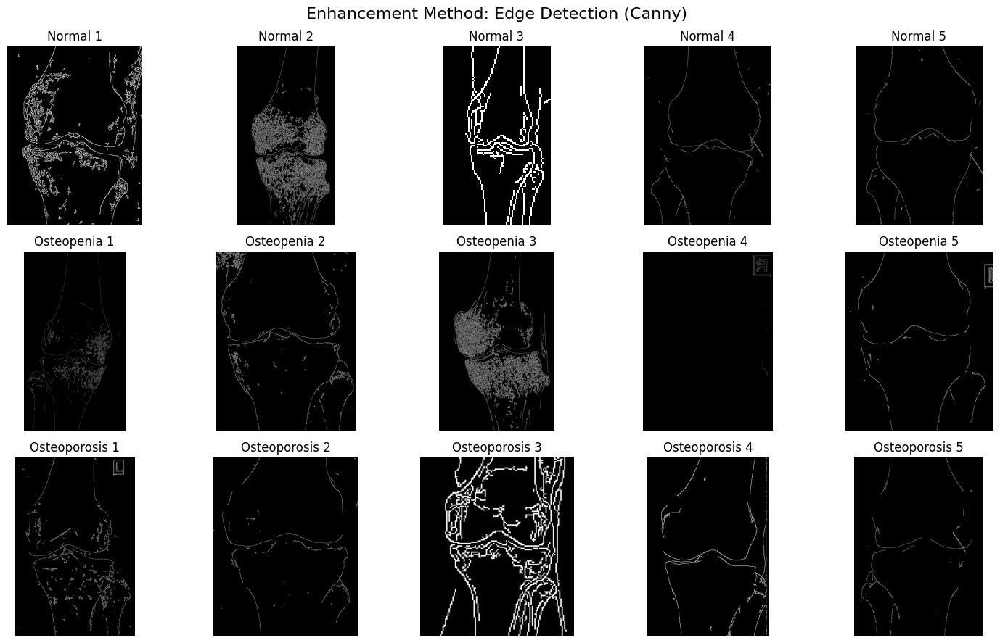

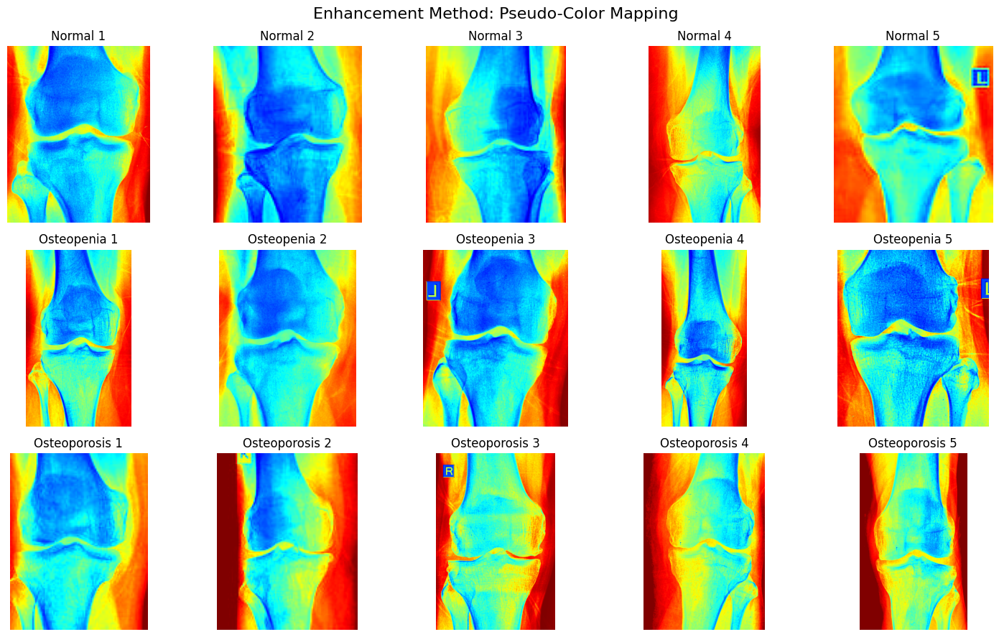

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques by Filter ###
def process_images_by_filter(base_path, categories, num_images=5):
    # Enhancement methods and their functions
    enhancement_methods = {
        "CLAHE (Contrast Enhancement)": apply_clahe,
        "Unsharp Masking (Sharpening)": apply_unsharp_mask,
        "Edge Detection (Canny)": apply_edge_detection,
        "Pseudo-Color Mapping": apply_pseudo_color,
    }

    # Iterate over each enhancement method
    for method_name, method_function in enhancement_methods.items():
        fig, axes = plt.subplots(len(categories), num_images, figsize=(15, 9))
        fig.suptitle(f"Enhancement Method: {method_name}", fontsize=16)

        for row_idx, category in enumerate(categories):
            category_path = os.path.join(base_path, category)

            # Ensure the folder exists and contains images
            if not os.path.exists(category_path) or not os.listdir(category_path):
                print(f"No images found in {category_path}. Skipping...")
                continue

            # Get all image files in the category
            image_files = [
                os.path.join(category_path, f)
                for f in os.listdir(category_path)
                if f.lower().endswith((".png", ".jpg", ".jpeg"))
            ]

            # Randomly select images to process
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Process each selected image
            for col_idx, image_path in enumerate(selected_images):
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading image: {image_path}")
                    continue
                
                # Apply enhancement method
                enhanced_img = method_function(img)

                # Plot result
                axes[row_idx, col_idx].imshow(enhanced_img, cmap="gray" if method_name != "Pseudo-Color Mapping" else None)
                axes[row_idx, col_idx].set_title(f"{category} {col_idx+1}")
                axes[row_idx, col_idx].axis("off")

        plt.tight_layout()
        plt.show()

# Run the function
process_images_by_filter(base_path, categories, num_images=5)

#### Apply CLAHE and Save to the New Folder Structure

In [ ]:
import os
import cv2
import shutil
import numpy as np
from tqdm import tqdm

# Define paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_augmented"
output_base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_enhanced_xrays"
output_clahe_path = os.path.join(output_base_path, "CLAHE")

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure directory structure
for category in categories:
    os.makedirs(os.path.join(output_clahe_path, category), exist_ok=True)

# Apply CLAHE function
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

# Process images
def enhance_images_with_clahe(input_path, output_path):
    """Applies CLAHE enhancement to all images in the dataset"""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Process each image
        for img_name in tqdm(os.listdir(category_path), desc=f"Applying CLAHE to {category}"):
            img_path = os.path.join(category_path, img_name)

            try:
                # Read and process image
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading {img_path}")
                    continue

                # Apply CLAHE
                enhanced_img = apply_clahe(img)

                # Save to new folder
                output_file_path = os.path.join(output_category_path, img_name)
                cv2.imwrite(output_file_path, enhanced_img)
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ CLAHE enhancement completed! Images saved in: {output_path}")

# Run the CLAHE enhancement process
enhance_images_with_clahe(input_path, output_clahe_path)

Applying CLAHE to Osteoporosis: 100%|██████| 1020/1020 [00:02<00:00, 444.14it/s]


✅ CLAHE enhancement completed! Images saved in: /Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_enhanced_xrays/CLAHE


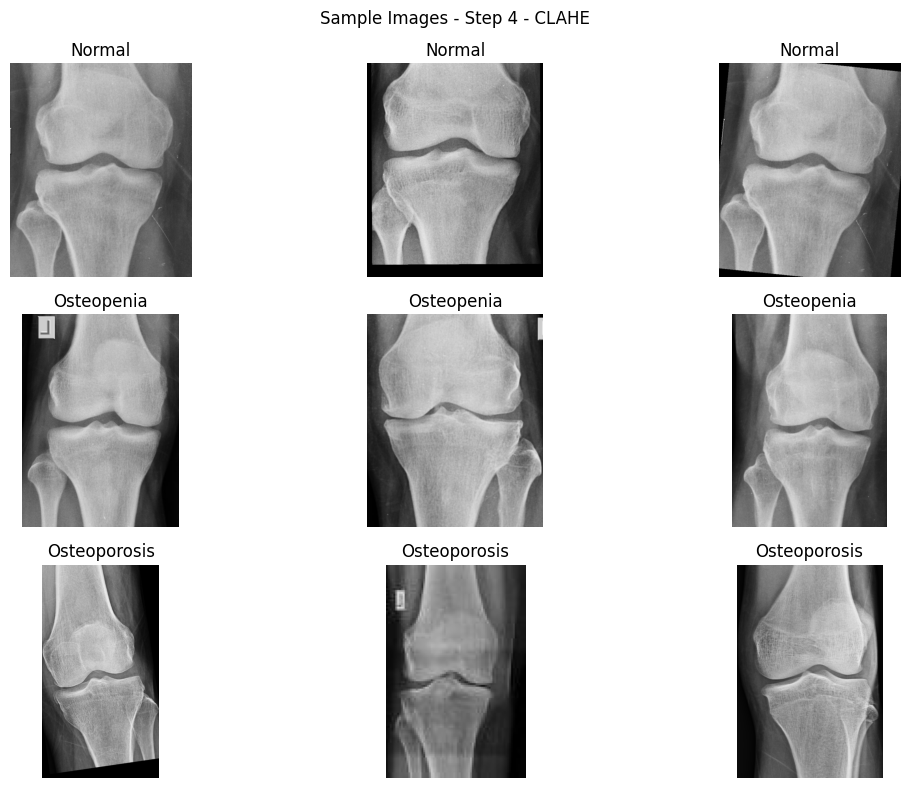


📊 **Dataset Statistics After Step 4 - CLAHE:**
  📂 Normal: 1536 images
  📂 Osteopenia: 1740 images
  📂 Osteoporosis: 1020 images


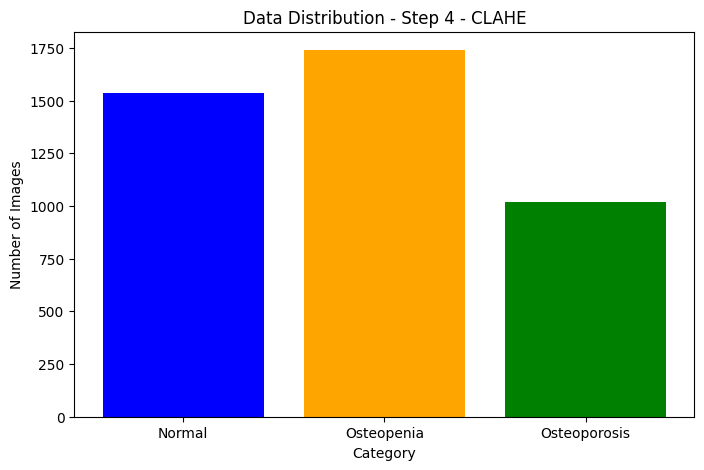

In [ ]:
show_sample_images(output_path_step3, "Step 4 - CLAHE")
dataset_statistics(output_path_step3, "Step 4 - CLAHE")

# Before applying any filter we need to think what to do with the  different resolution

### Second dataset -  Test Dataset Distribution Before Preprocessing

In [ ]:
# Paths
test_input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"
test_output_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset"

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)


📊 **Dataset Statistics After Test dataset:**
  📂 Normal: 36 images
  📂 Osteopenia: 154 images
  📂 Osteoporosis: 49 images


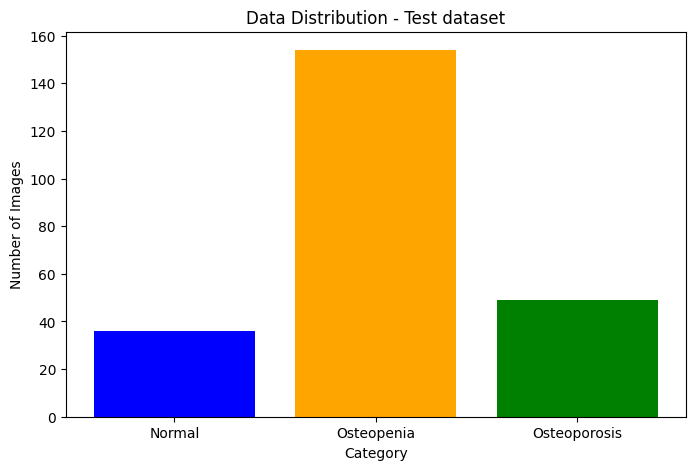

In [ ]:
dataset_statistics(test_input_path, "Test dataset")

Category-wise Statistics:
Category: Normal
  Duplicates: 3
  Unique Images: 33
Category: Osteopenia
  Duplicates: 13
  Unique Images: 141
Category: Osteoporosis
  Duplicates: 6
  Unique Images: 43

Duplicate Distribution:
  20 images have 1 duplicates.
  1 images have 2 duplicates.


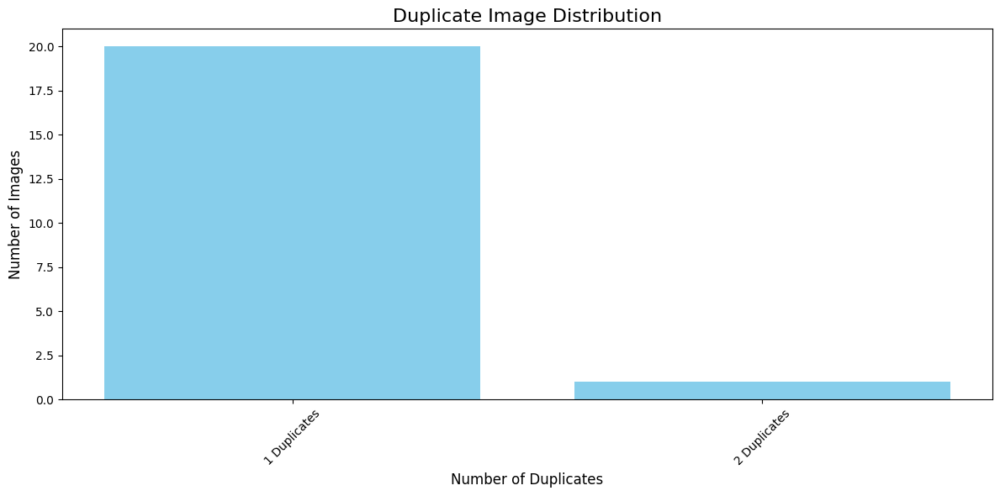


Displaying first 5 duplicate pairs:


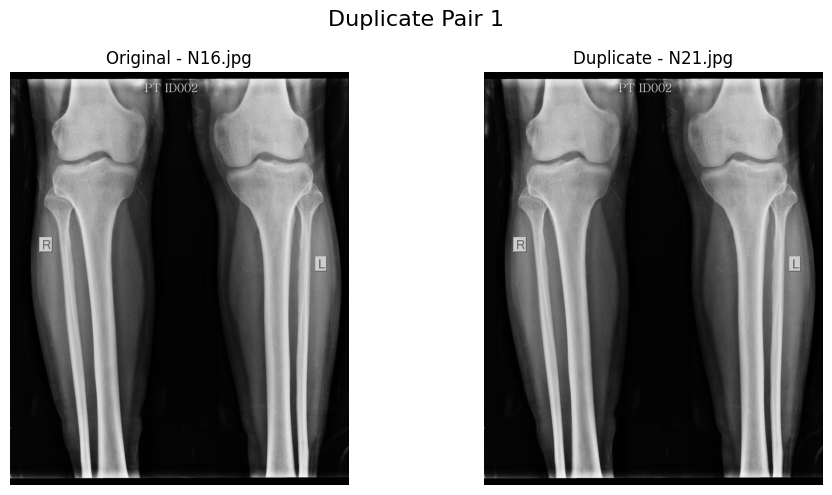

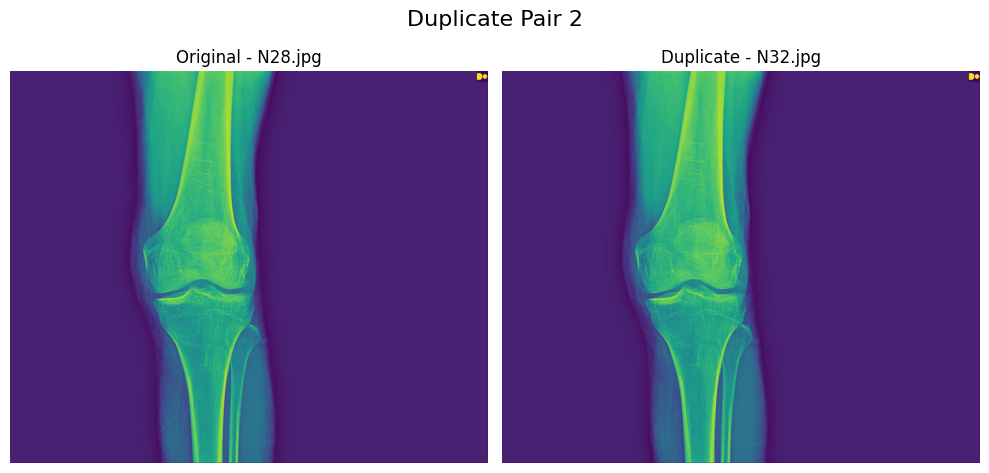

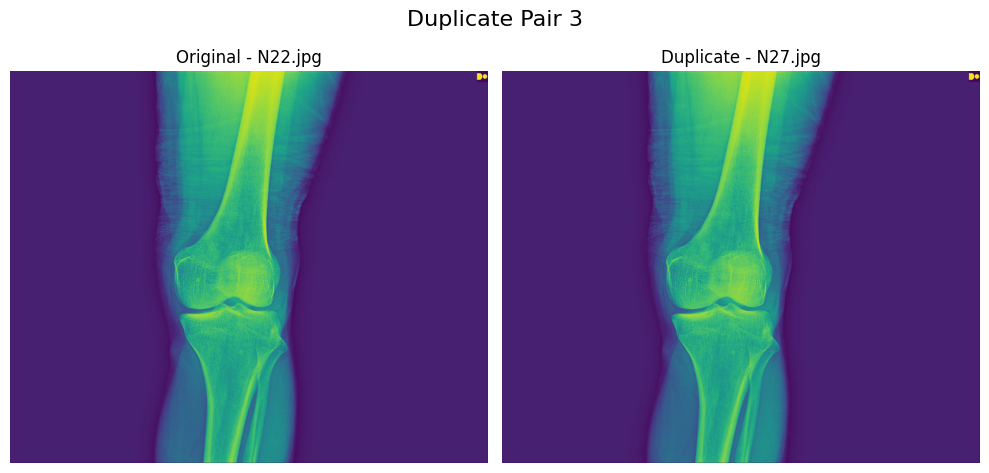

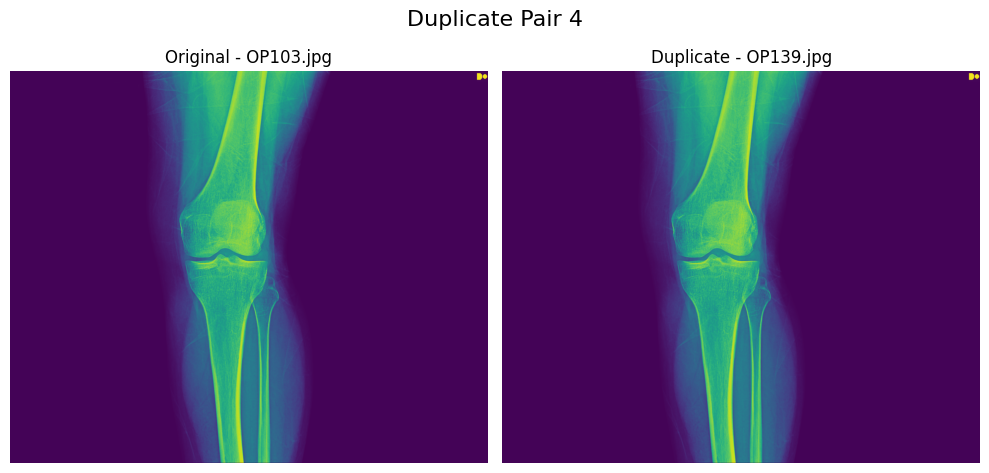

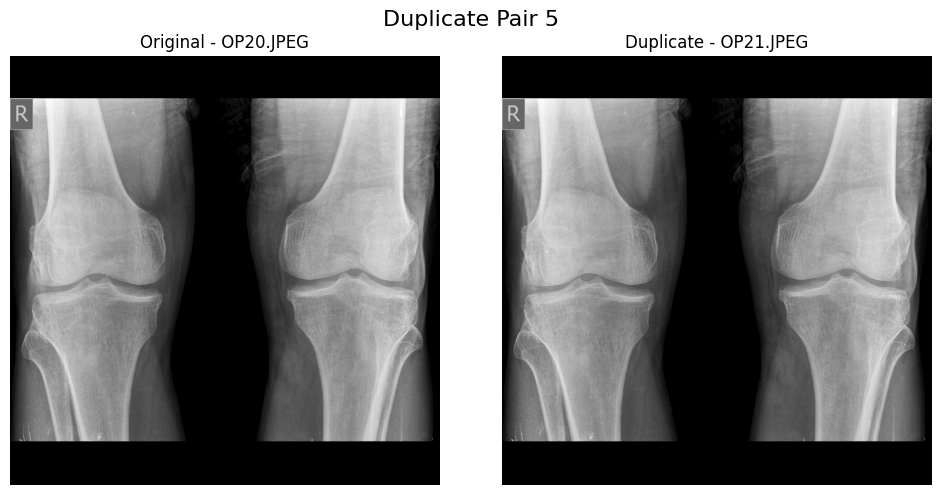

In [ ]:
import imagehash
from PIL import Image
import os
import matplotlib.pyplot as plt
from collections import defaultdict

# Base path to dataset
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Compute hashes and find duplicates
hashes = {}
duplicates = defaultdict(list)  # Dictionary to store duplicates by their original hash
category_stats = {cls: {"duplicates": 0, "unique": 0} for cls in categories}

for cls in categories:
    folder_path = os.path.join(base_path, cls)
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)
        try:
            img = Image.open(img_path)
            img_hash = imagehash.phash(img)  # Compute perceptual hash
            if img_hash in hashes:
                duplicates[img_hash].append(img_path)  # Group duplicates by hash
                category_stats[cls]["duplicates"] += 1
            else:
                hashes[img_hash] = img_path
                category_stats[cls]["unique"] += 1
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Output the statistics for each category
print("Category-wise Statistics:")
for cls, stats in category_stats.items():
    print(f"Category: {cls}")
    print(f"  Duplicates: {stats['duplicates']}")
    print(f"  Unique Images: {stats['unique']}")

# Analyze duplicate counts for detailed distribution (1, 2, 3, ... duplicates)
duplicate_distribution = defaultdict(int)
for original_img, duplicate_imgs in duplicates.items():
    duplicate_distribution[len(duplicate_imgs)] += 1

# Print duplicate distribution
print("\nDuplicate Distribution:")
for num_duplicates, num_images in sorted(duplicate_distribution.items()):
    print(f"  {num_images} images have {num_duplicates} duplicates.")

# Visualize the distribution as a bar chart
plt.figure(figsize=(12, 6))
plt.bar(
    [f"{k} Duplicates" for k in sorted(duplicate_distribution.keys())],
    [duplicate_distribution[k] for k in sorted(duplicate_distribution.keys())],
    color="skyblue",
)
plt.title("Duplicate Image Distribution", fontsize=16)
plt.ylabel("Number of Images", fontsize=12)
plt.xlabel("Number of Duplicates", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Display the first 5 duplicate pairs
def display_duplicates(duplicate_pairs, max_pairs=5):
    pairs_shown = 0
    for img_hash, dup_list in duplicate_pairs.items():
        if pairs_shown >= max_pairs:
            break
        original_img = hashes[img_hash]
        for duplicate_img in dup_list[:max_pairs]:
            try:
                img1 = Image.open(original_img)
                img2 = Image.open(duplicate_img)
                
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                axes[0].imshow(img1)
                axes[0].set_title(f"Original - {os.path.basename(original_img)}")
                axes[0].axis("off")

                axes[1].imshow(img2)
                axes[1].set_title(f"Duplicate - {os.path.basename(duplicate_img)}")
                axes[1].axis("off")

                plt.suptitle(f"Duplicate Pair {pairs_shown + 1}", fontsize=16)
                plt.tight_layout()
                plt.show()
                
                pairs_shown += 1
                if pairs_shown >= max_pairs:
                    break
            except Exception as e:
                print(f"Error displaying duplicate pair: {e}")

# Display first 5 duplicate pairs
print("\nDisplaying first 5 duplicate pairs:")
display_duplicates(duplicates, max_pairs=5)

In [ ]:
analyze_and_remove_duplicates(test_input_path, test_output_path)

Processing Osteoporosis: 100%|██████████████████| 49/49 [00:00<00:00, 64.13it/s]


✅ Step 1 Complete: 22 duplicate images removed.
